In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import cv2
import random
import xml.etree.ElementTree as ET
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
from collections import Counter

BASE_PATH = "/kaggle/input/pascal-voc-2012-dataset/VOC2012_train_val/VOC2012_train_val"
ANNOTATIONS_DIR = os.path.join(BASE_PATH, "Annotations")
IMAGES_DIR = os.path.join(BASE_PATH, "JPEGImages")

TARGET_CLASSES = ["bird", "cat", "dog", "person", "tvmonitor"]
CLASS_TO_IDX = {cls: i + 1 for i, cls in enumerate(TARGET_CLASSES)}
IDX_TO_CLASS = {i + 1: cls for i, cls in enumerate(TARGET_CLASSES)}
NUM_CLASSES = len(TARGET_CLASSES) + 1
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EPOCHS = 100
BATCH_SIZE = 8
LEARNING_RATE = 0.005
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005

In [2]:
def parse_voc_data():
    data_list = []
    xml_files = [f for f in os.listdir(ANNOTATIONS_DIR) if f.endswith(".xml")]
    for xml_file in xml_files:
        tree = ET.parse(os.path.join(ANNOTATIONS_DIR, xml_file))
        root = tree.getroot()
        img_id = root.find("filename").text.split(".")[0]
        valid_objs = []
        for obj in root.findall("object"):
            name = obj.find("name").text
            if name in TARGET_CLASSES:
                bbox = obj.find("bndbox")
                valid_objs.append({
                    "name": name,
                    "label": CLASS_TO_IDX[name],
                    "bbox": [
                        float(bbox.find("xmin").text),
                        float(bbox.find("ymin").text),
                        float(bbox.find("xmax").text),
                        float(bbox.find("ymax").text)
                    ]
                })
        if valid_objs:
            data_list.append({"img_id": img_id, "objects": valid_objs})
    return data_list

all_data = parse_voc_data()
random.shuffle(all_data)
train_split = int(0.85 * len(all_data))
train_data = all_data[:train_split]
val_data = all_data[train_split:]

In [4]:
import torch
import gc
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Clean up any residual fragments
gc.collect()
torch.cuda.empty_cache()

def create_scratch_model_final(num_classes):
    model = fasterrcnn_mobilenet_v3_large_fpn(
        weights=None, 
        weights_backbone=None,
        min_size=320, 
        max_size=480 
    )
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

model = create_scratch_model_final(NUM_CLASSES).to(DEVICE)
print("Model successfully loaded onto GPU!")

Model successfully loaded onto GPU!


In [6]:
import numpy as np
from collections import Counter

def calculate_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    inter = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    return inter / (area1 + area2 - inter + 1e-6)

def evaluate_metrics(model, loader, iou_thresh=0.5):
    model.eval()
    all_preds = []
    all_gts = []
    total_correct_cls = 0
    total_objects = 0
    
    with torch.no_grad():
        for images, targets in loader:
            images = [img.to(DEVICE) for img in images]
            outputs = model(images)
            
            for i, output in enumerate(outputs):
                gt_boxes = targets[i]["boxes"].cpu().numpy()
                gt_labels = targets[i]["labels"].cpu().numpy()
                pred_boxes = output["boxes"].cpu().numpy()
                pred_labels = output["labels"].cpu().numpy()
                pred_scores = output["scores"].cpu().numpy()
                
                img_id = targets[i]["image_id"].item()
                
                for idx in range(len(pred_boxes)):
                    all_preds.append({
                        "img_id": img_id,
                        "label": pred_labels[idx],
                        "score": pred_scores[idx],
                        "bbox": pred_boxes[idx]
                    })
                
                for idx in range(len(gt_boxes)):
                    all_gts.append({
                        "img_id": img_id,
                        "label": gt_labels[idx],
                        "bbox": gt_boxes[idx]
                    })
                
                total_objects += len(gt_labels)
                for gt_b, gt_l in zip(gt_boxes, gt_labels):
                    found = False
                    for pr_b, pr_l in zip(pred_boxes, pred_labels):
                        if calculate_iou(gt_b, pr_b) > iou_thresh and gt_l == pr_l:
                            found = True
                            break
                    if found:
                        total_correct_cls += 1

    ap_list = []
    for c in range(1, NUM_CLASSES):
        detections = [d for d in all_preds if d["label"] == c]
        ground_truths = [g for g in all_gts if g["label"] == c]
        
        if not ground_truths:
            continue
            
        detections.sort(key=lambda x: x["score"], reverse=True)
        tp = np.zeros(len(detections))
        fp = np.zeros(len(detections))
        
        gt_in_img = Counter([g["img_id"] for g in ground_truths])
        for img_id, count in gt_in_img.items():
            gt_in_img[img_id] = np.zeros(count)
            
        img_gt_map = {img_id: [g for g in ground_truths if g["img_id"] == img_id] for img_id in gt_in_img.keys()}

        for d_idx, d in enumerate(detections):
            if d["img_id"] not in img_gt_map:
                fp[d_idx] = 1
                continue
                
            relevant_gts = img_gt_map[d["img_id"]]
            best_iou = 0
            best_gt_idx = -1
            
            for g_idx, g in enumerate(relevant_gts):
                iou = calculate_iou(d["bbox"], g["bbox"])
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = g_idx
            
            if best_iou > iou_thresh:
                if gt_in_img[d["img_id"]][best_gt_idx] == 0:
                    tp[d_idx] = 1
                    gt_in_img[d["img_id"]][best_gt_idx] = 1
                else:
                    fp[d_idx] = 1
            else:
                fp[d_idx] = 1
            
        tp_cumsum = np.cumsum(tp)
        fp_cumsum = np.cumsum(fp)
        recalls = tp_cumsum / len(ground_truths)
        precisions = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
        
        precisions = np.concatenate(([1], precisions))
        recalls = np.concatenate(([0], recalls))
        ap_list.append(np.trapz(precisions, recalls))

    map_score = sum(ap_list) / len(ap_list) if ap_list else 0
    accuracy = total_correct_cls / (total_objects + 1e-6)
    return map_score, accuracy

In [7]:
import torch.amp as amp

BATCH_SIZE = 2 
ACCUMULATION_STEPS = 4 
EPOCHS = 100
MAX_ITER_PER_EPOCH = 312
LEARNING_RATE = 0.002

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=LEARNING_RATE, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
scaler = amp.GradScaler('cuda')

best_map = 0

for epoch in range(EPOCHS):
    model.train()
    epoch_loss = 0
    optimizer.zero_grad()
    
    pbar = tqdm(enumerate(train_loader), total=MAX_ITER_PER_EPOCH, desc=f"Epoch {epoch+1}/{EPOCHS}")
    
    for i, (images, targets) in pbar:
        if i >= MAX_ITER_PER_EPOCH: break
            
        images = [img.to(DEVICE) for img in images]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        
        with amp.autocast('cuda'):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values()) / ACCUMULATION_STEPS

        scaler.scale(losses).backward()
        
        if (i + 1) % ACCUMULATION_STEPS == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
        
        epoch_loss += losses.item() * ACCUMULATION_STEPS
        pbar.set_postfix({"Loss": (losses.item() * ACCUMULATION_STEPS)})
    
    # Save a checkpoint every epoch to be safe
    val_map, val_acc = evaluate_metrics(model, val_loader)
    lr_scheduler.step()
    
    print(f"\n[Epoch {epoch+1}] Loss: {epoch_loss/MAX_ITER_PER_EPOCH:.4f} | mAP: {val_map:.4f}")
    
    if val_map > best_map:
        best_map = val_map
        torch.save(model.state_dict(), "best_model_scratch.pth")

torch.save(model.state_dict(), "final_model_scratch.pth")

Epoch 1/100: 100%|██████████| 312/312 [00:59<00:00,  5.26it/s, Loss=0.881]
/tmp/ipykernel_55/1790041589.py:109: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ap_list.append(np.trapz(precisions, recalls))



[Epoch 1] Loss: 0.8896 | mAP: 0.0102


Epoch 2/100: 100%|██████████| 312/312 [01:15<00:00,  4.13it/s, Loss=0.571]



[Epoch 2] Loss: 0.5975 | mAP: 0.0276


Epoch 3/100: 100%|██████████| 312/312 [01:04<00:00,  4.87it/s, Loss=0.708]



[Epoch 3] Loss: 0.5302 | mAP: 0.0334


Epoch 4/100: 100%|██████████| 312/312 [00:53<00:00,  5.84it/s, Loss=0.525]



[Epoch 4] Loss: 0.5094 | mAP: 0.0421


Epoch 5/100: 100%|██████████| 312/312 [00:52<00:00,  5.93it/s, Loss=0.454]



[Epoch 5] Loss: 0.5196 | mAP: 0.0442


Epoch 6/100: 100%|██████████| 312/312 [00:52<00:00,  5.94it/s, Loss=0.403]



[Epoch 6] Loss: 0.5222 | mAP: 0.0538


Epoch 7/100: 100%|██████████| 312/312 [00:52<00:00,  5.99it/s, Loss=0.562]



[Epoch 7] Loss: 0.5153 | mAP: 0.0609


Epoch 8/100: 100%|██████████| 312/312 [00:51<00:00,  6.07it/s, Loss=0.375]



[Epoch 8] Loss: 0.5293 | mAP: 0.0726


Epoch 9/100: 100%|██████████| 312/312 [00:59<00:00,  5.24it/s, Loss=0.513]



[Epoch 9] Loss: 0.5316 | mAP: 0.0730


Epoch 10/100: 100%|██████████| 312/312 [00:50<00:00,  6.23it/s, Loss=0.536]



[Epoch 10] Loss: 0.5356 | mAP: 0.0784


Epoch 11/100: 100%|██████████| 312/312 [00:50<00:00,  6.23it/s, Loss=0.65] 



[Epoch 11] Loss: 0.5252 | mAP: 0.0895


Epoch 12/100: 100%|██████████| 312/312 [00:49<00:00,  6.26it/s, Loss=0.457]



[Epoch 12] Loss: 0.5493 | mAP: 0.0828


Epoch 13/100: 100%|██████████| 312/312 [00:50<00:00,  6.23it/s, Loss=0.714]



[Epoch 13] Loss: 0.5490 | mAP: 0.0983


Epoch 14/100: 100%|██████████| 312/312 [00:50<00:00,  6.24it/s, Loss=0.439]



[Epoch 14] Loss: 0.5546 | mAP: 0.0989


Epoch 15/100: 100%|██████████| 312/312 [00:49<00:00,  6.34it/s, Loss=0.498]



[Epoch 15] Loss: 0.5709 | mAP: 0.0976


Epoch 16/100: 100%|██████████| 312/312 [00:49<00:00,  6.34it/s, Loss=0.494]



[Epoch 16] Loss: 0.5563 | mAP: 0.1031


Epoch 17/100: 100%|██████████| 312/312 [00:49<00:00,  6.33it/s, Loss=0.397]



[Epoch 17] Loss: 0.5396 | mAP: 0.1136


Epoch 18/100: 100%|██████████| 312/312 [00:48<00:00,  6.43it/s, Loss=0.494]



[Epoch 18] Loss: 0.5767 | mAP: 0.1071


Epoch 19/100: 100%|██████████| 312/312 [00:49<00:00,  6.36it/s, Loss=0.65] 



[Epoch 19] Loss: 0.5583 | mAP: 0.1086


Epoch 20/100: 100%|██████████| 312/312 [00:49<00:00,  6.33it/s, Loss=0.498]



[Epoch 20] Loss: 0.5609 | mAP: 0.1223


Epoch 21/100: 100%|██████████| 312/312 [00:48<00:00,  6.42it/s, Loss=0.389]



[Epoch 21] Loss: 0.5753 | mAP: 0.1181


Epoch 22/100: 100%|██████████| 312/312 [00:48<00:00,  6.45it/s, Loss=0.718]



[Epoch 22] Loss: 0.5705 | mAP: 0.1212


Epoch 23/100: 100%|██████████| 312/312 [00:48<00:00,  6.41it/s, Loss=0.445]



[Epoch 23] Loss: 0.5711 | mAP: 0.1305


Epoch 24/100: 100%|██████████| 312/312 [00:48<00:00,  6.42it/s, Loss=0.474]



[Epoch 24] Loss: 0.5565 | mAP: 0.1304


Epoch 25/100: 100%|██████████| 312/312 [00:47<00:00,  6.52it/s, Loss=0.79] 



[Epoch 25] Loss: 0.5741 | mAP: 0.1378


Epoch 26/100: 100%|██████████| 312/312 [00:48<00:00,  6.48it/s, Loss=0.377]



[Epoch 26] Loss: 0.5752 | mAP: 0.1323


Epoch 27/100: 100%|██████████| 312/312 [00:48<00:00,  6.42it/s, Loss=0.639]



[Epoch 27] Loss: 0.5763 | mAP: 0.1339


Epoch 28/100: 100%|██████████| 312/312 [00:48<00:00,  6.47it/s, Loss=0.616]



[Epoch 28] Loss: 0.5613 | mAP: 0.1320


Epoch 29/100: 100%|██████████| 312/312 [00:48<00:00,  6.48it/s, Loss=0.471]



[Epoch 29] Loss: 0.5711 | mAP: 0.1436


Epoch 30/100: 100%|██████████| 312/312 [00:47<00:00,  6.50it/s, Loss=0.403]



[Epoch 30] Loss: 0.5709 | mAP: 0.1363


Epoch 31/100: 100%|██████████| 312/312 [00:47<00:00,  6.57it/s, Loss=0.873]



[Epoch 31] Loss: 0.5916 | mAP: 0.1364


Epoch 32/100: 100%|██████████| 312/312 [00:47<00:00,  6.53it/s, Loss=0.463]



[Epoch 32] Loss: 0.5736 | mAP: 0.1561


Epoch 33/100: 100%|██████████| 312/312 [00:48<00:00,  6.48it/s, Loss=0.564]



[Epoch 33] Loss: 0.5952 | mAP: 0.1563


Epoch 34/100: 100%|██████████| 312/312 [00:55<00:00,  5.58it/s, Loss=0.572]



[Epoch 34] Loss: 0.5791 | mAP: 0.1573


Epoch 35/100: 100%|██████████| 312/312 [00:47<00:00,  6.60it/s, Loss=0.549]



[Epoch 35] Loss: 0.5794 | mAP: 0.1591


Epoch 36/100: 100%|██████████| 312/312 [00:47<00:00,  6.54it/s, Loss=0.597]



[Epoch 36] Loss: 0.5604 | mAP: 0.1580


Epoch 37/100: 100%|██████████| 312/312 [00:47<00:00,  6.55it/s, Loss=0.539]



[Epoch 37] Loss: 0.5697 | mAP: 0.1569


Epoch 38/100: 100%|██████████| 312/312 [00:47<00:00,  6.55it/s, Loss=0.398]



[Epoch 38] Loss: 0.5819 | mAP: 0.1651


Epoch 39/100: 100%|██████████| 312/312 [00:47<00:00,  6.57it/s, Loss=0.508]



[Epoch 39] Loss: 0.5690 | mAP: 0.1593


Epoch 40/100: 100%|██████████| 312/312 [00:47<00:00,  6.56it/s, Loss=0.46] 



[Epoch 40] Loss: 0.5679 | mAP: 0.1587


Epoch 41/100: 100%|██████████| 312/312 [00:47<00:00,  6.53it/s, Loss=0.511]



[Epoch 41] Loss: 0.5823 | mAP: 0.1615


Epoch 42/100: 100%|██████████| 312/312 [00:47<00:00,  6.54it/s, Loss=0.483]



[Epoch 42] Loss: 0.5802 | mAP: 0.1712


Epoch 43/100: 100%|██████████| 312/312 [00:47<00:00,  6.57it/s, Loss=0.498]



[Epoch 43] Loss: 0.5833 | mAP: 0.1703


Epoch 44/100: 100%|██████████| 312/312 [00:47<00:00,  6.54it/s, Loss=0.372]



[Epoch 44] Loss: 0.5703 | mAP: 0.1710


Epoch 45/100: 100%|██████████| 312/312 [00:47<00:00,  6.59it/s, Loss=0.636]



[Epoch 45] Loss: 0.5693 | mAP: 0.1758


Epoch 46/100: 100%|██████████| 312/312 [00:46<00:00,  6.65it/s, Loss=0.442]



[Epoch 46] Loss: 0.5848 | mAP: 0.1764


Epoch 47/100: 100%|██████████| 312/312 [00:47<00:00,  6.61it/s, Loss=0.671]



[Epoch 47] Loss: 0.5700 | mAP: 0.1800


Epoch 48/100: 100%|██████████| 312/312 [00:47<00:00,  6.62it/s, Loss=0.535]



[Epoch 48] Loss: 0.5754 | mAP: 0.1783


Epoch 49/100: 100%|██████████| 312/312 [00:46<00:00,  6.65it/s, Loss=0.692]



[Epoch 49] Loss: 0.5822 | mAP: 0.1824


Epoch 50/100: 100%|██████████| 312/312 [00:47<00:00,  6.62it/s, Loss=0.503]



[Epoch 50] Loss: 0.5857 | mAP: 0.1802


Epoch 51/100: 100%|██████████| 312/312 [00:46<00:00,  6.68it/s, Loss=0.621]



[Epoch 51] Loss: 0.5852 | mAP: 0.1809


Epoch 52/100: 100%|██████████| 312/312 [00:46<00:00,  6.69it/s, Loss=0.594]



[Epoch 52] Loss: 0.5890 | mAP: 0.1902


Epoch 53/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.645]



[Epoch 53] Loss: 0.5813 | mAP: 0.1897


Epoch 54/100: 100%|██████████| 312/312 [00:46<00:00,  6.67it/s, Loss=0.501]



[Epoch 54] Loss: 0.5917 | mAP: 0.1818


Epoch 55/100: 100%|██████████| 312/312 [00:46<00:00,  6.69it/s, Loss=0.609]



[Epoch 55] Loss: 0.5992 | mAP: 0.1883


Epoch 56/100: 100%|██████████| 312/312 [00:47<00:00,  6.64it/s, Loss=0.495]



[Epoch 56] Loss: 0.5932 | mAP: 0.1861


Epoch 57/100: 100%|██████████| 312/312 [00:46<00:00,  6.72it/s, Loss=0.502]



[Epoch 57] Loss: 0.6026 | mAP: 0.1878


Epoch 58/100: 100%|██████████| 312/312 [00:46<00:00,  6.68it/s, Loss=0.561]



[Epoch 58] Loss: 0.5908 | mAP: 0.1890


Epoch 59/100: 100%|██████████| 312/312 [00:47<00:00,  6.62it/s, Loss=0.67] 



[Epoch 59] Loss: 0.5883 | mAP: 0.1953


Epoch 60/100: 100%|██████████| 312/312 [00:47<00:00,  6.57it/s, Loss=0.579]



[Epoch 60] Loss: 0.5985 | mAP: 0.1923


Epoch 61/100: 100%|██████████| 312/312 [00:47<00:00,  6.64it/s, Loss=0.542]



[Epoch 61] Loss: 0.5901 | mAP: 0.1908


Epoch 62/100: 100%|██████████| 312/312 [00:47<00:00,  6.63it/s, Loss=0.372]



[Epoch 62] Loss: 0.5917 | mAP: 0.1907


Epoch 63/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.546]



[Epoch 63] Loss: 0.6014 | mAP: 0.1926


Epoch 64/100: 100%|██████████| 312/312 [00:46<00:00,  6.72it/s, Loss=0.572]



[Epoch 64] Loss: 0.5933 | mAP: 0.1940


Epoch 65/100: 100%|██████████| 312/312 [00:46<00:00,  6.66it/s, Loss=0.471]



[Epoch 65] Loss: 0.5804 | mAP: 0.1957


Epoch 66/100: 100%|██████████| 312/312 [00:46<00:00,  6.65it/s, Loss=0.671]



[Epoch 66] Loss: 0.5863 | mAP: 0.2052


Epoch 67/100: 100%|██████████| 312/312 [00:46<00:00,  6.65it/s, Loss=0.646]



[Epoch 67] Loss: 0.5915 | mAP: 0.1986


Epoch 68/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.673]



[Epoch 68] Loss: 0.5836 | mAP: 0.2027


Epoch 69/100: 100%|██████████| 312/312 [00:47<00:00,  6.54it/s, Loss=0.585]



[Epoch 69] Loss: 0.5882 | mAP: 0.1981


Epoch 70/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.853]



[Epoch 70] Loss: 0.5856 | mAP: 0.1963


Epoch 71/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.576]



[Epoch 71] Loss: 0.5819 | mAP: 0.2035


Epoch 72/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.32] 



[Epoch 72] Loss: 0.5831 | mAP: 0.2014


Epoch 73/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.534]



[Epoch 73] Loss: 0.5896 | mAP: 0.2051


Epoch 74/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.367]



[Epoch 74] Loss: 0.5945 | mAP: 0.2061


Epoch 75/100: 100%|██████████| 312/312 [00:46<00:00,  6.75it/s, Loss=0.781]



[Epoch 75] Loss: 0.5879 | mAP: 0.2044


Epoch 76/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.817]



[Epoch 76] Loss: 0.5977 | mAP: 0.2029


Epoch 77/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.56] 



[Epoch 77] Loss: 0.5938 | mAP: 0.2050


Epoch 78/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.57] 



[Epoch 78] Loss: 0.5777 | mAP: 0.2075


Epoch 79/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.687]



[Epoch 79] Loss: 0.5881 | mAP: 0.2078


Epoch 80/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.339]



[Epoch 80] Loss: 0.5812 | mAP: 0.2035


Epoch 81/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.526]



[Epoch 81] Loss: 0.5741 | mAP: 0.2036


Epoch 82/100: 100%|██████████| 312/312 [00:46<00:00,  6.67it/s, Loss=0.559]



[Epoch 82] Loss: 0.5851 | mAP: 0.2078


Epoch 83/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.691]



[Epoch 83] Loss: 0.5868 | mAP: 0.2092


Epoch 84/100: 100%|██████████| 312/312 [00:46<00:00,  6.75it/s, Loss=0.686]



[Epoch 84] Loss: 0.5897 | mAP: 0.2055


Epoch 85/100: 100%|██████████| 312/312 [00:46<00:00,  6.74it/s, Loss=0.569]



[Epoch 85] Loss: 0.5879 | mAP: 0.2043


Epoch 86/100: 100%|██████████| 312/312 [00:46<00:00,  6.76it/s, Loss=0.665]



[Epoch 86] Loss: 0.5927 | mAP: 0.2078


Epoch 87/100: 100%|██████████| 312/312 [00:46<00:00,  6.69it/s, Loss=0.582]



[Epoch 87] Loss: 0.5976 | mAP: 0.2076


Epoch 88/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.608]



[Epoch 88] Loss: 0.5915 | mAP: 0.2070


Epoch 89/100: 100%|██████████| 312/312 [00:46<00:00,  6.70it/s, Loss=0.528]



[Epoch 89] Loss: 0.5866 | mAP: 0.2080


Epoch 90/100: 100%|██████████| 312/312 [00:46<00:00,  6.71it/s, Loss=0.566]



[Epoch 90] Loss: 0.5914 | mAP: 0.2091


Epoch 91/100: 100%|██████████| 312/312 [00:46<00:00,  6.68it/s, Loss=0.868]



[Epoch 91] Loss: 0.5991 | mAP: 0.2086


Epoch 92/100: 100%|██████████| 312/312 [00:46<00:00,  6.67it/s, Loss=0.694]



[Epoch 92] Loss: 0.5871 | mAP: 0.2068


Epoch 93/100: 100%|██████████| 312/312 [00:46<00:00,  6.72it/s, Loss=0.549]



[Epoch 93] Loss: 0.5888 | mAP: 0.2060


Epoch 94/100: 100%|██████████| 312/312 [00:46<00:00,  6.69it/s, Loss=0.356]



[Epoch 94] Loss: 0.5942 | mAP: 0.2071


Epoch 95/100: 100%|██████████| 312/312 [00:46<00:00,  6.74it/s, Loss=0.587]



[Epoch 95] Loss: 0.6048 | mAP: 0.2070


Epoch 96/100: 100%|██████████| 312/312 [00:46<00:00,  6.74it/s, Loss=0.507]



[Epoch 96] Loss: 0.5883 | mAP: 0.2068


Epoch 97/100: 100%|██████████| 312/312 [00:46<00:00,  6.74it/s, Loss=0.53] 



[Epoch 97] Loss: 0.5904 | mAP: 0.2088


Epoch 98/100: 100%|██████████| 312/312 [00:46<00:00,  6.76it/s, Loss=0.717]



[Epoch 98] Loss: 0.5968 | mAP: 0.2095


Epoch 99/100: 100%|██████████| 312/312 [00:46<00:00,  6.73it/s, Loss=0.453]



[Epoch 99] Loss: 0.5813 | mAP: 0.2074


Epoch 100/100: 100%|██████████| 312/312 [00:46<00:00,  6.74it/s, Loss=0.684]



[Epoch 100] Loss: 0.6023 | mAP: 0.2068


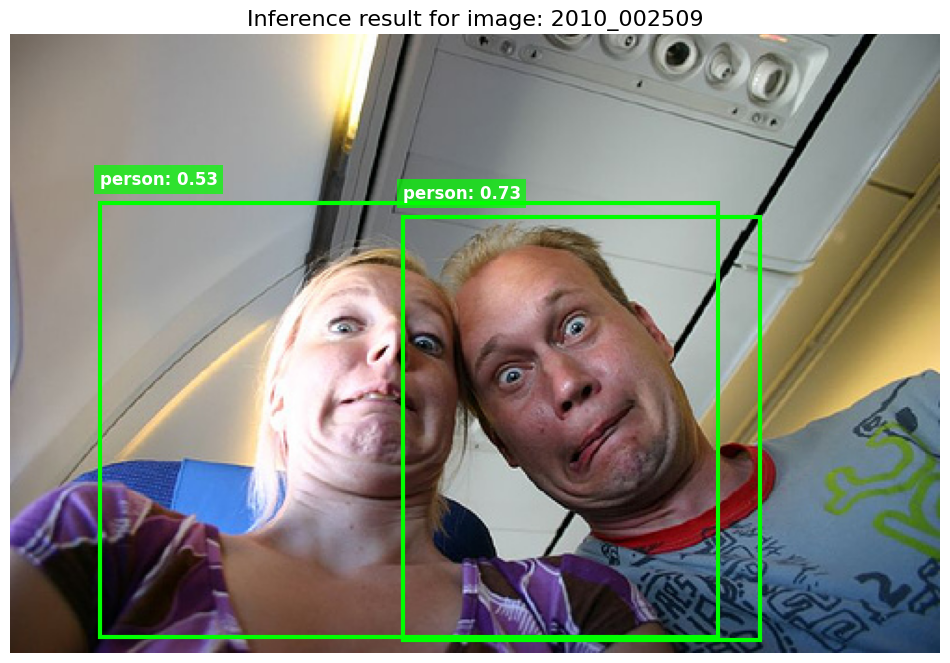

In [19]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import random
import cv2
from PIL import Image

def visualize_inference(model, val_data, threshold=0.5):
    model.eval()
    item = random.choice(val_data)
    img_id = item['img_id']
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    for i in range(len(boxes)):
        box = boxes[i]
        label = labels[i]
        score = scores[i]
        
        width = box[2] - box[0]
        height = box[3] - box[1]
        rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=3, edgecolor='#00FF00', facecolor='none')
        ax.add_patch(rect)
        
        class_name = IDX_TO_CLASS[label]
        text = f"{class_name}: {score:.2f}"
        ax.text(box[0], box[1] - 10, text, color='white', fontsize=12, fontweight='bold',
                bbox=dict(facecolor='#00FF00', edgecolor='none', alpha=0.7))
    
    plt.title(f"Inference result for image: {img_id}", fontsize=16)
    plt.axis('off')
    plt.show()

visualize_inference(model, val_data, threshold=0.5)

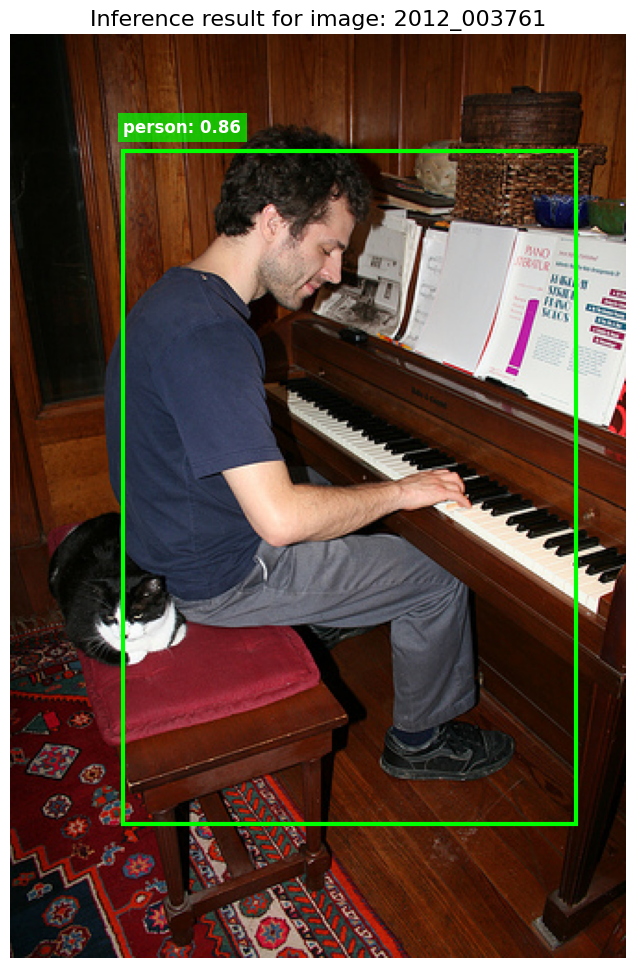

In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import random
import cv2
from PIL import Image

def visualize_inference(model, val_data, threshold=0.5):
    model.eval()
    item = random.choice(val_data)
    img_id = item['img_id']
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    for i in range(len(boxes)):
        box = boxes[i]
        label = labels[i]
        score = scores[i]
        
        width = box[2] - box[0]
        height = box[3] - box[1]
        rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=3, edgecolor='#00FF00', facecolor='none')
        ax.add_patch(rect)
        
        class_name = IDX_TO_CLASS[label]
        text = f"{class_name}: {score:.2f}"
        ax.text(box[0], box[1] - 10, text, color='white', fontsize=12, fontweight='bold',
                bbox=dict(facecolor='#00FF00', edgecolor='none', alpha=0.7))
    
    plt.title(f"Inference result for image: {img_id}", fontsize=16)
    plt.axis('off')
    plt.show()

visualize_inference(model, val_data, threshold=0.5)

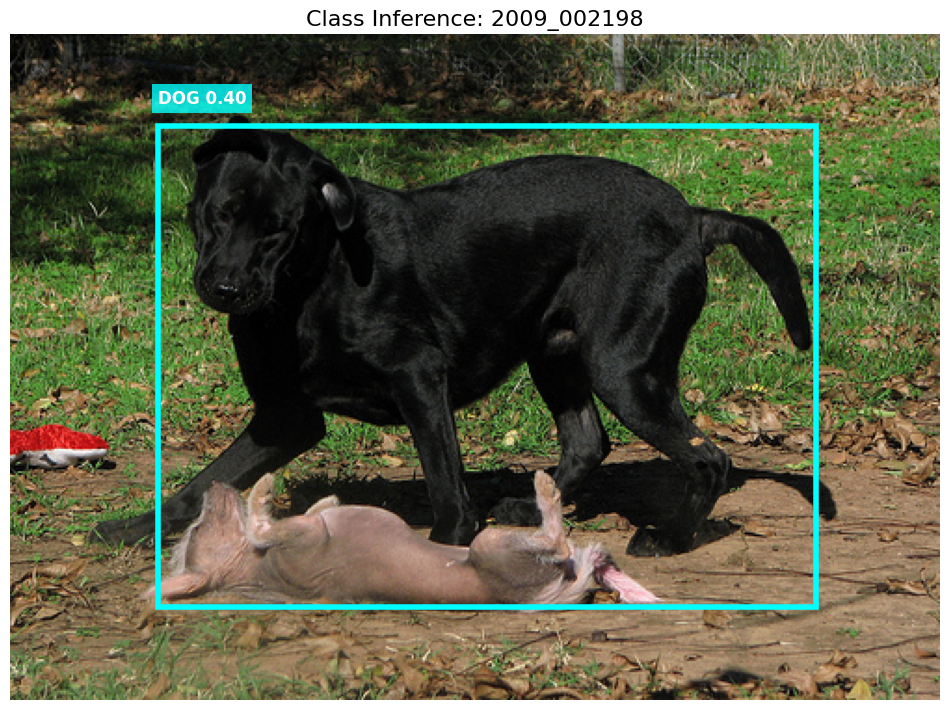

In [31]:
import os
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_non_person_inference(model, val_data, threshold=0.35):
    non_person_targets = ["bird", "cat", "dog", "tvmonitor"]
    
    valid_candidate_ids = []
    for item in val_data:
        contains_target = any(obj['name'] in non_person_targets for obj in item['objects'])
        if contains_target:
            valid_candidate_ids.append(item['img_id'])
            
    if not valid_candidate_ids:
        print("No images found containing non-person classes in the validation set.")
        return

    img_id = random.choice(valid_candidate_ids)
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    model.eval()
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    detected_any = False
    for i in range(len(boxes)):
        class_name = IDX_TO_CLASS[labels[i]]
        
        if class_name in non_person_targets:
            detected_any = True
            box = boxes[i]
            score = scores[i]
            
            width = box[2] - box[0]
            height = box[3] - box[1]
            
            rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=4, edgecolor='#00FFFF', facecolor='none')
            ax.add_patch(rect)
            
            label_text = f"{class_name.upper()} {score:.2f}"
            ax.text(box[0], box[1] - 12, label_text, color='white', fontsize=12, fontweight='bold',
                    bbox=dict(facecolor='#00FFFF', edgecolor='none', alpha=0.8))

    if not detected_any:
        print(f"Model found no non-person targets in {img_id} at threshold {threshold}. Try running again or lowering threshold.")
    
    plt.title(f"Class Inference: {img_id}", fontsize=16)
    plt.axis('off')
    plt.show()

visualize_non_person_inference(model, val_data, threshold=0.30)

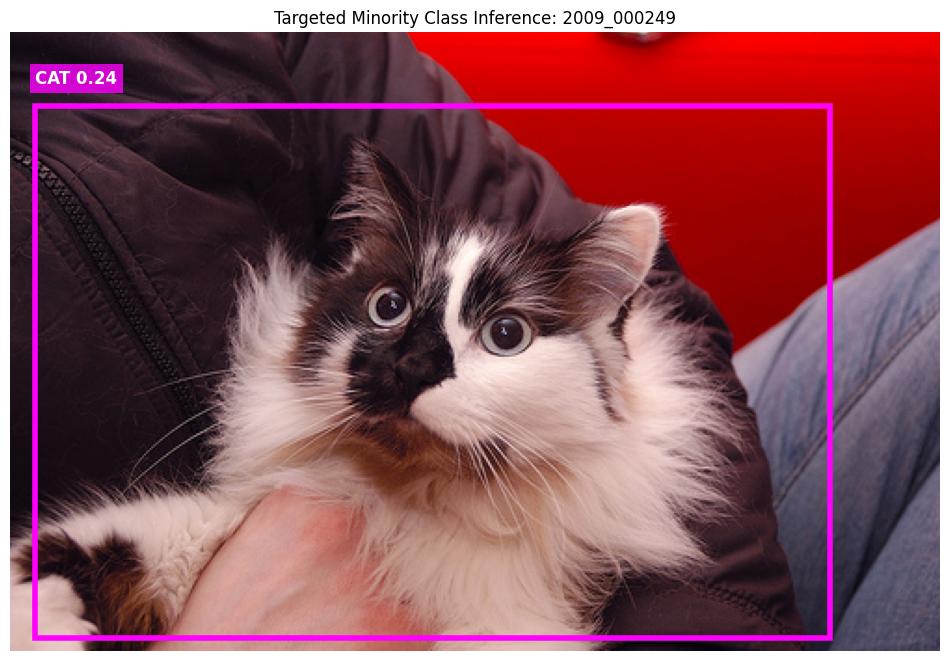

In [43]:
import os
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_specific_minority_classes(model, val_data, target_list=["tvmonitor", "cat", "bird"], threshold=0.15):
    model.eval()
    
    candidate_ids = []
    for item in val_data:
        if any(obj['name'] in target_list for obj in item['objects']):
            candidate_ids.append(item['img_id'])
            
    if not candidate_ids:
        return

    img_id = random.choice(candidate_ids)
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    detected = False
    for i in range(len(boxes)):
        class_name = IDX_TO_CLASS[labels[i]]
        if class_name in target_list:
            detected = True
            box = boxes[i]
            width = box[2] - box[0]
            height = box[3] - box[1]
            
            rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=4, edgecolor='#FF00FF', facecolor='none')
            ax.add_patch(rect)
            
            label_text = f"{class_name.upper()} {scores[i]:.2f}"
            ax.text(box[0], box[1] - 12, label_text, color='white', fontsize=12, fontweight='bold',
                    bbox=dict(facecolor='#FF00FF', edgecolor='none', alpha=0.8))

    plt.title(f"Targeted Minority Class Inference: {img_id}")
    plt.axis('off')
    plt.show()

visualize_specific_minority_classes(model, val_data, threshold=0.18)

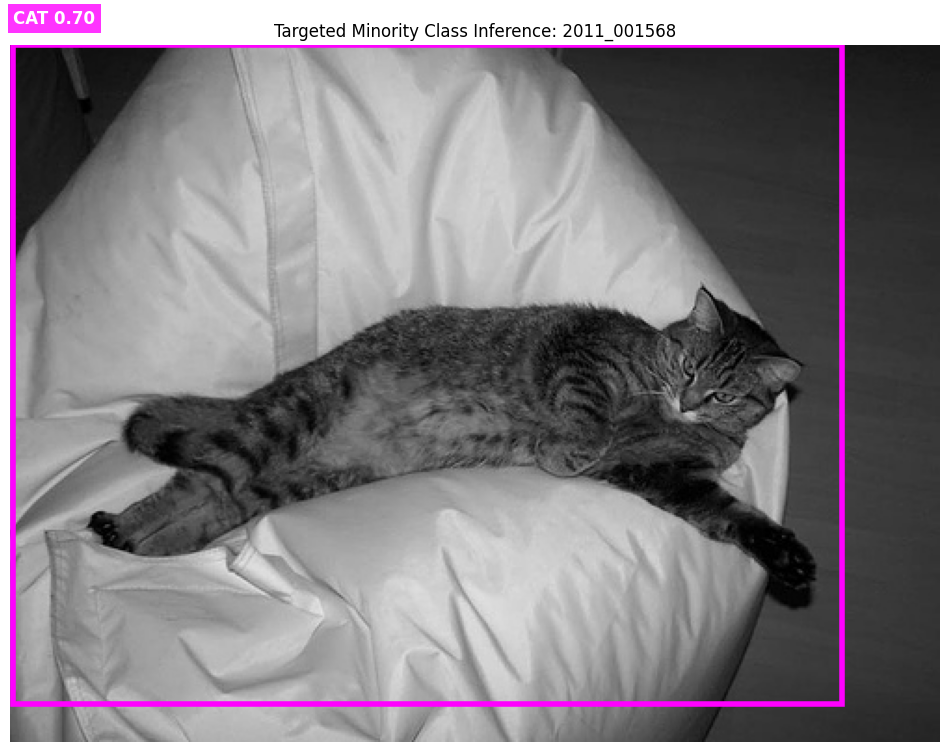

In [44]:
import os
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_specific_minority_classes(model, val_data, target_list=["tvmonitor", "cat", "bird"], threshold=0.15):
    model.eval()
    
    candidate_ids = []
    for item in val_data:
        if any(obj['name'] in target_list for obj in item['objects']):
            candidate_ids.append(item['img_id'])
            
    if not candidate_ids:
        return

    img_id = random.choice(candidate_ids)
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    detected = False
    for i in range(len(boxes)):
        class_name = IDX_TO_CLASS[labels[i]]
        if class_name in target_list:
            detected = True
            box = boxes[i]
            width = box[2] - box[0]
            height = box[3] - box[1]
            
            rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=4, edgecolor='#FF00FF', facecolor='none')
            ax.add_patch(rect)
            
            label_text = f"{class_name.upper()} {scores[i]:.2f}"
            ax.text(box[0], box[1] - 12, label_text, color='white', fontsize=12, fontweight='bold',
                    bbox=dict(facecolor='#FF00FF', edgecolor='none', alpha=0.8))

    plt.title(f"Targeted Minority Class Inference: {img_id}")
    plt.axis('off')
    plt.show()

visualize_specific_minority_classes(model, val_data, threshold=0.18)

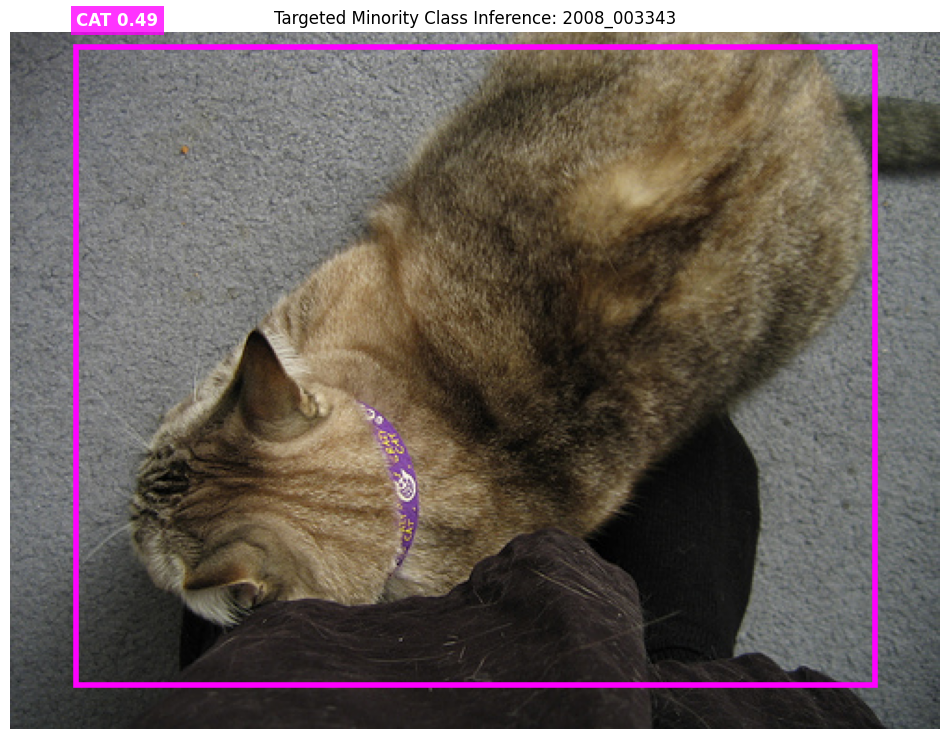

In [45]:
import os
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_specific_minority_classes(model, val_data, target_list=["tvmonitor", "cat", "bird"], threshold=0.15):
    model.eval()
    
    candidate_ids = []
    for item in val_data:
        if any(obj['name'] in target_list for obj in item['objects']):
            candidate_ids.append(item['img_id'])
            
    if not candidate_ids:
        return

    img_id = random.choice(candidate_ids)
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    detected = False
    for i in range(len(boxes)):
        class_name = IDX_TO_CLASS[labels[i]]
        if class_name in target_list:
            detected = True
            box = boxes[i]
            width = box[2] - box[0]
            height = box[3] - box[1]
            
            rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=4, edgecolor='#FF00FF', facecolor='none')
            ax.add_patch(rect)
            
            label_text = f"{class_name.upper()} {scores[i]:.2f}"
            ax.text(box[0], box[1] - 12, label_text, color='white', fontsize=12, fontweight='bold',
                    bbox=dict(facecolor='#FF00FF', edgecolor='none', alpha=0.8))

    plt.title(f"Targeted Minority Class Inference: {img_id}")
    plt.axis('off')
    plt.show()

visualize_specific_minority_classes(model, val_data, threshold=0.18)

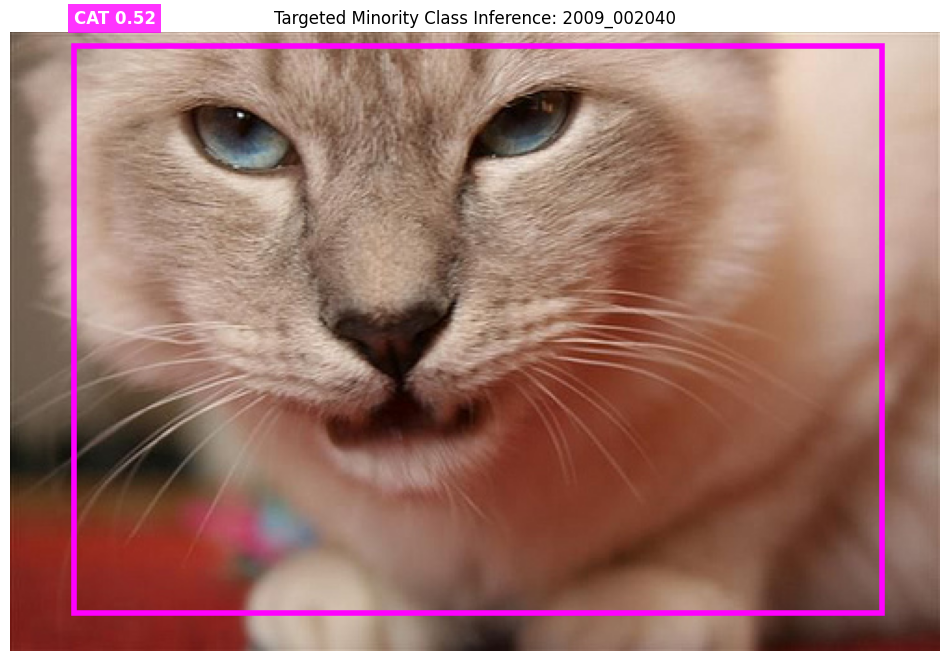

In [49]:
import os
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_specific_minority_classes(model, val_data, target_list=["tvmonitor", "cat", "bird"], threshold=0.15):
    model.eval()
    
    candidate_ids = []
    for item in val_data:
        if any(obj['name'] in target_list for obj in item['objects']):
            candidate_ids.append(item['img_id'])
            
    if not candidate_ids:
        return

    img_id = random.choice(candidate_ids)
    img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
    
    image_cv = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb.astype(np.float32) / 255.0
    
    input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(input_tensor)
    
    output = outputs[0]
    boxes = output['boxes'].cpu().numpy()
    labels = output['labels'].cpu().numpy()
    scores = output['scores'].cpu().numpy()
    
    mask = scores >= threshold
    boxes = boxes[mask]
    labels = labels[mask]
    scores = scores[mask]
    
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image_rgb)
    
    detected = False
    for i in range(len(boxes)):
        class_name = IDX_TO_CLASS[labels[i]]
        if class_name in target_list:
            detected = True
            box = boxes[i]
            width = box[2] - box[0]
            height = box[3] - box[1]
            
            rect = patches.Rectangle((box[0], box[1]), width, height, linewidth=4, edgecolor='#FF00FF', facecolor='none')
            ax.add_patch(rect)
            
            label_text = f"{class_name.upper()} {scores[i]:.2f}"
            ax.text(box[0], box[1] - 12, label_text, color='white', fontsize=12, fontweight='bold',
                    bbox=dict(facecolor='#FF00FF', edgecolor='none', alpha=0.8))

    plt.title(f"Targeted Minority Class Inference: {img_id}")
    plt.axis('off')
    plt.show()

visualize_specific_minority_classes(model, val_data, threshold=0.18)

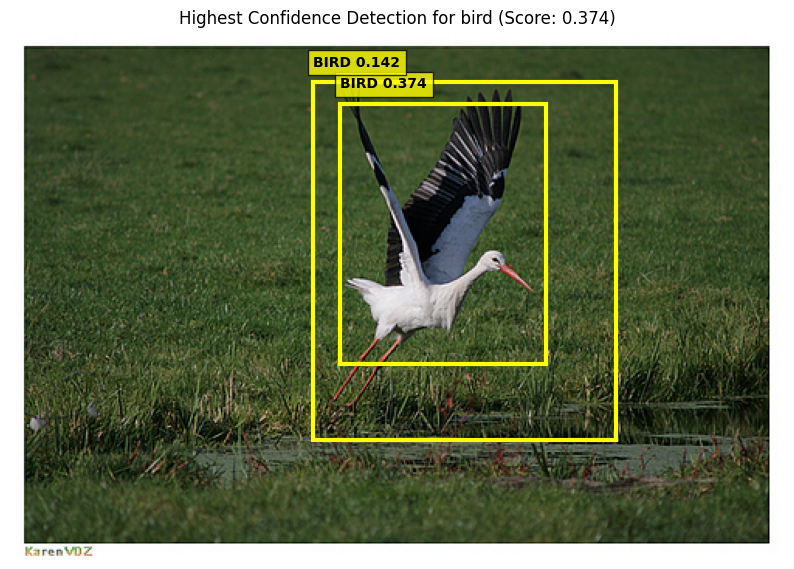

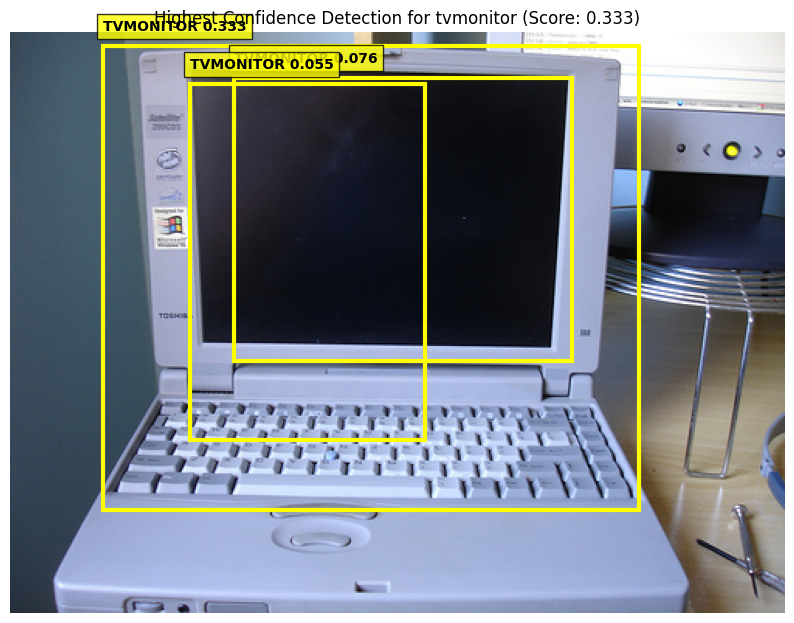

In [60]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def force_find_best_inference(model, val_data, target_class, top_n=3):
    model.eval()
    best_score = -1
    best_img_id = None
    best_results = None

    valid_ids = []
    for item in val_data:
        if any(obj['name'] == target_class for obj in item['objects']):
            valid_ids.append(item['img_id'])
    
    random_subset = random.sample(valid_ids, min(len(valid_ids), 50))

    for img_id in random_subset:
        img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
        image_cv = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
        image_normalized = image_rgb.astype(np.float32) / 255.0
        input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
        
        with torch.no_grad():
            outputs = model(input_tensor)
        
        output = outputs[0]
        boxes = output['boxes'].cpu().numpy()
        labels = output['labels'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        
        class_mask = np.array([IDX_TO_CLASS[l] == target_class for l in labels])
        if np.any(class_mask):
            current_max = np.max(scores[class_mask])
            if current_max > best_score:
                best_score = current_max
                best_img_id = img_id
                idx = np.where(class_mask)[0]
                sorted_idx = idx[np.argsort(scores[class_mask])][::-1]
                best_results = {
                    "img": image_rgb,
                    "boxes": boxes[sorted_idx[:top_n]],
                    "scores": scores[sorted_idx[:top_n]]
                }

    if best_results:
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(best_results["img"])
        for b, s in zip(best_results["boxes"], best_results["scores"]):
            rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=3, edgecolor='#FFFF00', facecolor='none')
            ax.add_patch(rect)
            ax.text(b[0], b[1]-10, f"{target_class.upper()} {s:.3f}", color='black', fontweight='bold', bbox=dict(facecolor='#FFFF00', alpha=0.8))
        plt.title(f"Highest Confidence Detection for {target_class} (Score: {best_score:.3f})")
        plt.axis('off')
        plt.show()
    else:
        print(f"No {target_class} proposals found in subset.")

force_find_best_inference(model, val_data, "bird")
force_find_best_inference(model, val_data, "tvmonitor")

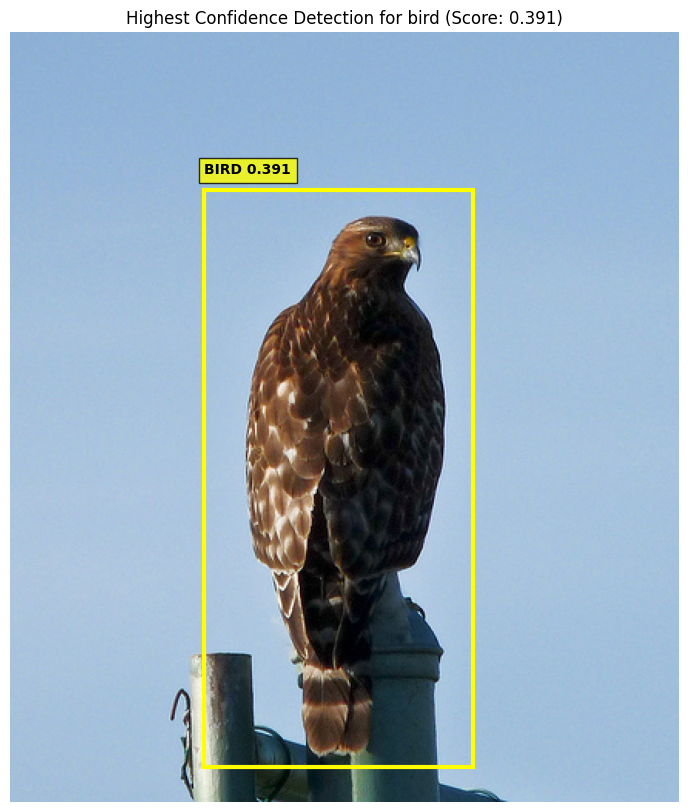

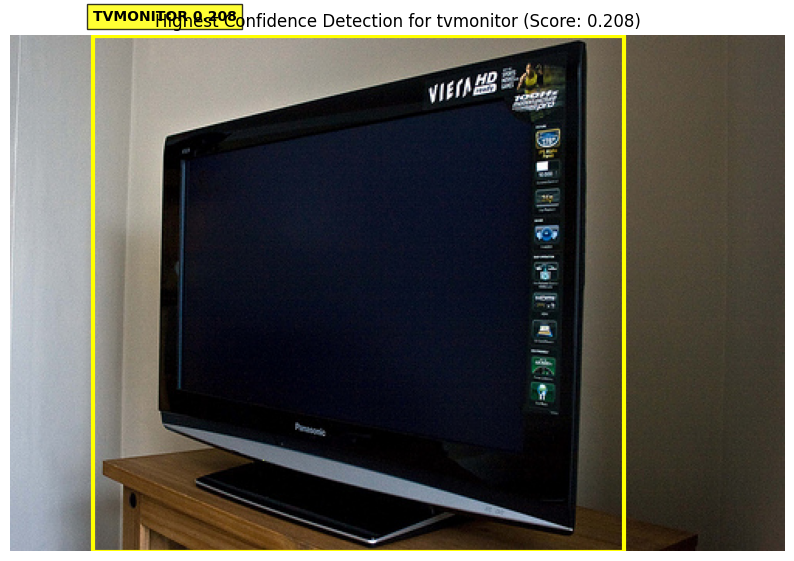

In [61]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def force_find_best_inference(model, val_data, target_class, top_n=3):
    model.eval()
    best_score = -1
    best_img_id = None
    best_results = None

    valid_ids = []
    for item in val_data:
        if any(obj['name'] == target_class for obj in item['objects']):
            valid_ids.append(item['img_id'])
    
    random_subset = random.sample(valid_ids, min(len(valid_ids), 50))

    for img_id in random_subset:
        img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
        image_cv = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
        image_normalized = image_rgb.astype(np.float32) / 255.0
        input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
        
        with torch.no_grad():
            outputs = model(input_tensor)
        
        output = outputs[0]
        boxes = output['boxes'].cpu().numpy()
        labels = output['labels'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        
        class_mask = np.array([IDX_TO_CLASS[l] == target_class for l in labels])
        if np.any(class_mask):
            current_max = np.max(scores[class_mask])
            if current_max > best_score:
                best_score = current_max
                best_img_id = img_id
                idx = np.where(class_mask)[0]
                sorted_idx = idx[np.argsort(scores[class_mask])][::-1]
                best_results = {
                    "img": image_rgb,
                    "boxes": boxes[sorted_idx[:top_n]],
                    "scores": scores[sorted_idx[:top_n]]
                }

    if best_results:
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(best_results["img"])
        for b, s in zip(best_results["boxes"], best_results["scores"]):
            rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=3, edgecolor='#FFFF00', facecolor='none')
            ax.add_patch(rect)
            ax.text(b[0], b[1]-10, f"{target_class.upper()} {s:.3f}", color='black', fontweight='bold', bbox=dict(facecolor='#FFFF00', alpha=0.8))
        plt.title(f"Highest Confidence Detection for {target_class} (Score: {best_score:.3f})")
        plt.axis('off')
        plt.show()
    else:
        print(f"No {target_class} proposals found in subset.")

force_find_best_inference(model, val_data, "bird")
force_find_best_inference(model, val_data, "tvmonitor")

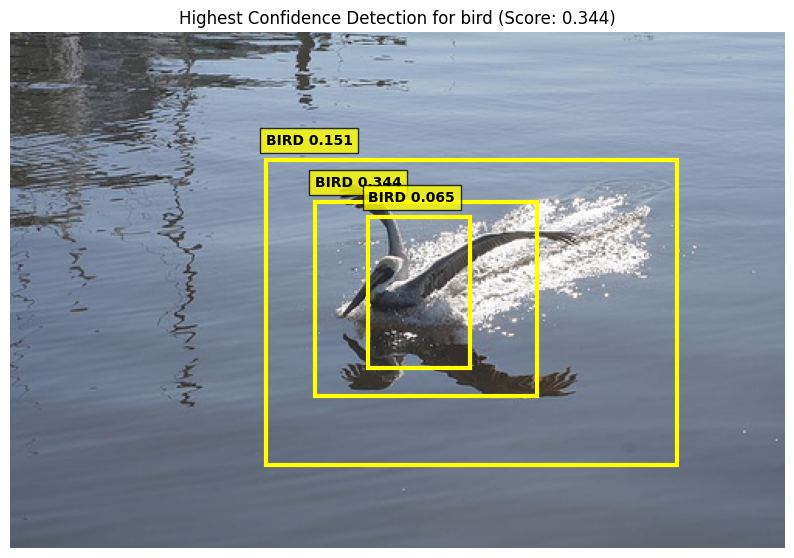

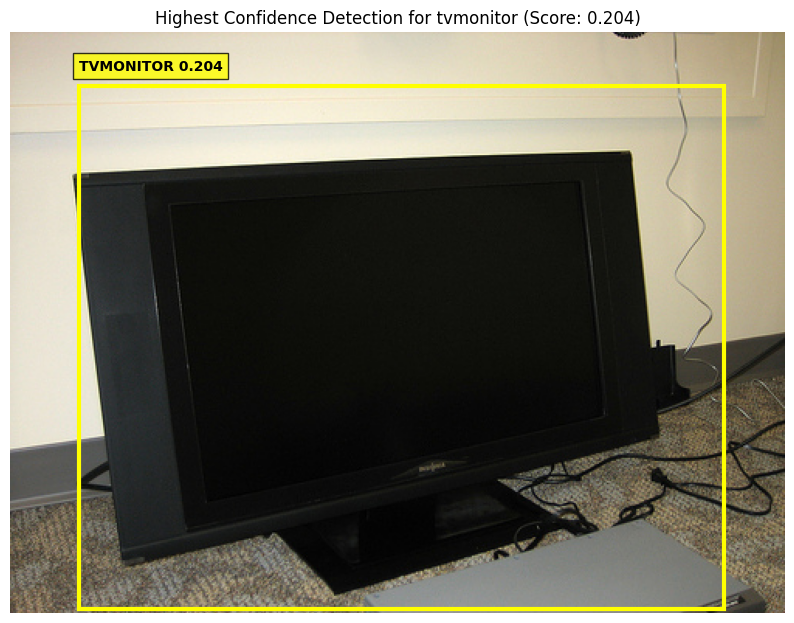

In [66]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def force_find_best_inference(model, val_data, target_class, top_n=3):
    model.eval()
    best_score = -1
    best_img_id = None
    best_results = None

    valid_ids = []
    for item in val_data:
        if any(obj['name'] == target_class for obj in item['objects']):
            valid_ids.append(item['img_id'])
    
    random_subset = random.sample(valid_ids, min(len(valid_ids), 50))

    for img_id in random_subset:
        img_path = os.path.join(IMAGES_DIR, f"{img_id}.jpg")
        image_cv = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
        image_normalized = image_rgb.astype(np.float32) / 255.0
        input_tensor = torch.from_numpy(image_normalized).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
        
        with torch.no_grad():
            outputs = model(input_tensor)
        
        output = outputs[0]
        boxes = output['boxes'].cpu().numpy()
        labels = output['labels'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        
        class_mask = np.array([IDX_TO_CLASS[l] == target_class for l in labels])
        if np.any(class_mask):
            current_max = np.max(scores[class_mask])
            if current_max > best_score:
                best_score = current_max
                best_img_id = img_id
                idx = np.where(class_mask)[0]
                sorted_idx = idx[np.argsort(scores[class_mask])][::-1]
                best_results = {
                    "img": image_rgb,
                    "boxes": boxes[sorted_idx[:top_n]],
                    "scores": scores[sorted_idx[:top_n]]
                }

    if best_results:
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(best_results["img"])
        for b, s in zip(best_results["boxes"], best_results["scores"]):
            rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=3, edgecolor='#FFFF00', facecolor='none')
            ax.add_patch(rect)
            ax.text(b[0], b[1]-10, f"{target_class.upper()} {s:.3f}", color='black', fontweight='bold', bbox=dict(facecolor='#FFFF00', alpha=0.8))
        plt.title(f"Highest Confidence Detection for {target_class} (Score: {best_score:.3f})")
        plt.axis('off')
        plt.show()
    else:
        print(f"No {target_class} proposals found in subset.")

force_find_best_inference(model, val_data, "bird")
force_find_best_inference(model, val_data, "tvmonitor")